### Extracting Text from Images in Python

In [1]:
import pandas as pd
import numpy as np

from glob import glob
from tqdm.notebook import tqdm

import matplotlib.pyplot as plt
from PIL import Image

plt.style.use('ggplot')

In [14]:
# annot = pd.read_parquet('../input/textocr-text-extraction-from-images-dataset/annot.parquet')
# imgs = pd.read_parquet('../input/textocr-text-extraction-from-images-dataset/img.parquet')
img_fns = glob('receipts-retail-dataset/images/*')

# glob retuns images path array
img_fns

['receipts-retail-dataset/images/0.jpg',
 'receipts-retail-dataset/images/1.jpg',
 'receipts-retail-dataset/images/10.jpg',
 'receipts-retail-dataset/images/11.jpg',
 'receipts-retail-dataset/images/12.jpg',
 'receipts-retail-dataset/images/13.jpg',
 'receipts-retail-dataset/images/14.jpg',
 'receipts-retail-dataset/images/15.jpg',
 'receipts-retail-dataset/images/16.jpg',
 'receipts-retail-dataset/images/17.jpg',
 'receipts-retail-dataset/images/18.jpg',
 'receipts-retail-dataset/images/19.jpg',
 'receipts-retail-dataset/images/2.jpg',
 'receipts-retail-dataset/images/3.jpg',
 'receipts-retail-dataset/images/4.jpg',
 'receipts-retail-dataset/images/5.jpg',
 'receipts-retail-dataset/images/6.JPG',
 'receipts-retail-dataset/images/7.jpg',
 'receipts-retail-dataset/images/8.jpg',
 'receipts-retail-dataset/images/9.jpg']

In [15]:
# create annot, imgs dataframe
import pandas as pd

# initialize list of lists
annot= ['0','1','2','3','4','5','6','7',
        '8','9','10','11','12','13','14',
        '15','16','17','18','19']
# type= ['recipt0','recipt1','recipt2','recipt3','recipt4','recipt5','recipt6','recipt7',
#         'recipt8','recipt9','recipt10','recipt11','recipt12','recipt13','recipt14',
#         'recipt15','recipt16','recipt17','recipt18','recipt19']

imgs= ['img0','img1','img2','img3','img4','img5','img6','img7','img8','img9','img10',
       'img11','img12','img13','img14','img15','img16','img17','img18','img19']

# list_of_tuples = dict(zip(annot, imgs))

# Assign data to tuples.
# list_of_tuples

# Create the pandas DataFrame
# df = pd.DataFrame(list_of_tuples, columns=['Annot', 'imgs'])
df = pd.DataFrame(annot,columns=['id'])

# print(df)
type(df),df

# ?export annot as parquet and try as robmullaa method

(pandas.core.frame.DataFrame,
     id
 0    0
 1    1
 2    2
 3    3
 4    4
 5    5
 6    6
 7    7
 8    8
 9    9
 10  10
 11  11
 12  12
 13  13
 14  14
 15  15
 16  16
 17  17
 18  18
 19  19)

# Plot Example Images

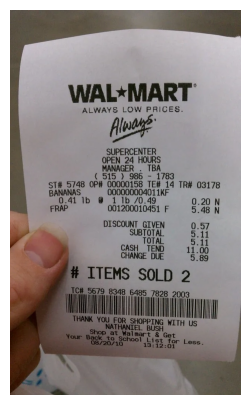

In [9]:
fig, ax = plt.subplots(figsize=(5, 5))
ax.imshow(plt.imread(img_fns[0]))
ax.axis('off')
plt.show()

In [ ]:
# extract image name(ID) using split
# img_fns[0].split('/')[-1].split('.')
# img_fns[0].split('/')[-1].split('.')[0]

# image_id = []
# for i in range(10):
#     image_id = img_fns[0].split('/')[-1].split('.')[0]
#     image_id.append('image_id')

# here we are trying to get the nales of images in an arrray
# if needed

## Display for first 25 images

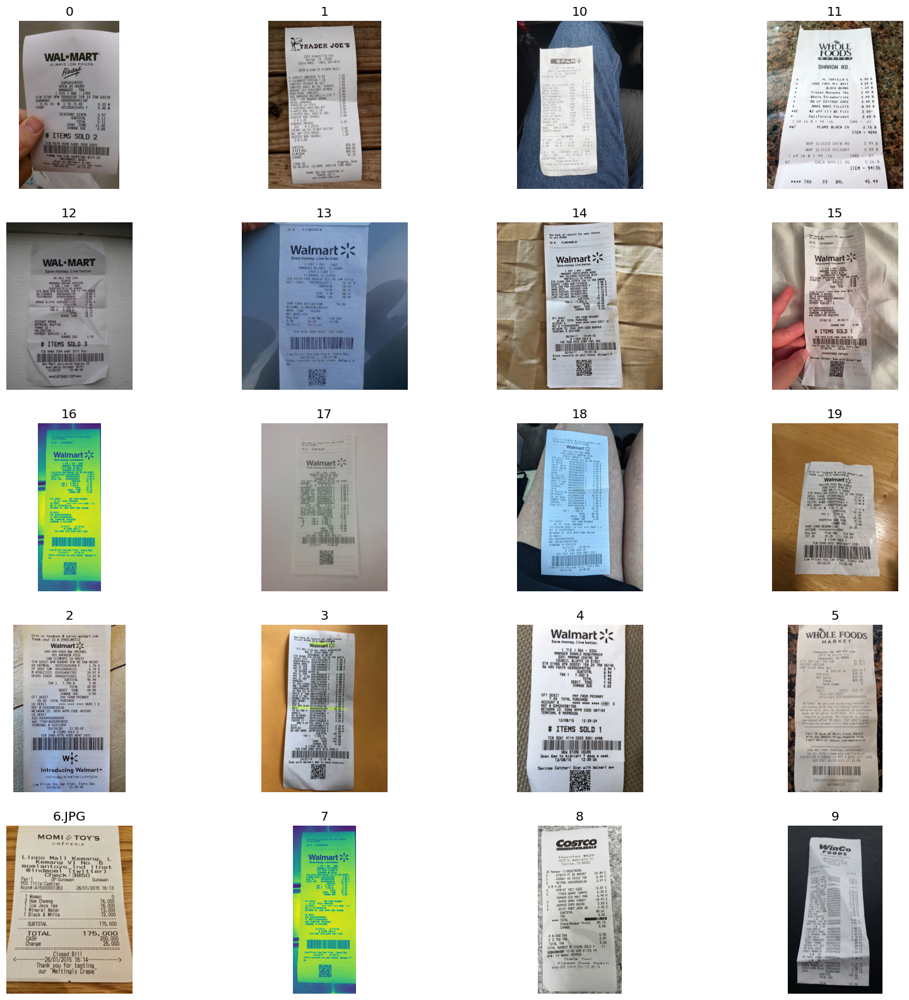

In [21]:
fig, axs = plt.subplots(5, 4, figsize=(20, 20))
axs = axs.flatten()
for i in range(20):
    axs[i].imshow(plt.imread(img_fns[i]))
    axs[i].axis('off')
    image_id = img_fns[i].split('/')[-1].rstrip('.jpg')
    # n_annot = len(image_id)
    # n_annot = len(annot.query('image_id == @image_id'))
    axs[i].set_title(f'{image_id}')
plt.show()

# Method 1: pytesseract

# Method 2: easyocr

In [22]:
import easyocr

reader = easyocr.Reader(['en'], gpu = True)

In [23]:
results = reader.readtext(img_fns[11])

In [24]:
pd.DataFrame(results, columns=['bbox','text','conf'])

,bbox,text,conf
0,"[[213, 275], [253, 275], [253, 291], [213, 291]]",Give,0.720529
1,"[[257, 279], [279, 279], [279, 293], [257, 293]]",uS,0.755619
2,"[[285, 279], [375, 279], [375, 297], [285, 297]]",feedback @,0.975854
3,"[[379, 281], [435, 281], [435, 295], [379, 295]]",survey,0.996178
4,"[[211, 289], [356, 289], [356, 314], [211, 314]]",Thank youl ID #:,0.613505
...,...,...,...
57,"[[385.2572186472918, 532.1430466182295], [433....",TOTAL,0.823033
58,"[[305.2307692307692, 626.1538461538462], [350....",Tran,0.999959
59,"[[375.30537128835283, 782.1245024785526], [429...",Trust _,0.998881
60,"[[439.2572186472918, 790.1430466182295], [498....",Every,0.999561


# Method 3: keras_ocr

In [ ]:
# !pip install keras-ocr -q

In [25]:
import keras_ocr

pipeline = keras_ocr.pipeline.Pipeline()

2024-12-21 12:44:03.345785: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-21 12:44:03.346062: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-21 12:44:03.402700: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-21 12:44:03.523353: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-21 12:44:02.727884: W tensorflow/compiler/tf2

Looking for /home/datas/.keras-ocr/craft_mlt_25k.h5


2024-12-21 12:44:04.989158: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:09:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-12-21 12:44:04.995970: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2256] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


Instructions for updating:
Use `tf.image.resize(...method=ResizeMethod.BILINEAR...)` instead.
Looking for /home/datas/.keras-ocr/crnn_kurapan.h5


In [26]:
results = pipeline.recognize([img_fns[1]])

2024-12-21 12:44:57.507697: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 721420288 exceeds 10% of free system memory.
2024-12-21 12:44:57.882159: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 721420288 exceeds 10% of free system memory.
2024-12-21 12:44:58.449434: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 721420288 exceeds 10% of free system memory.
2024-12-21 12:44:59.333275: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 721420288 exceeds 10% of free system memory.
2024-12-21 12:45:05.774874: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 541065216 exceeds 10% of free system memory.


6/6 [==============================] - 13s 2s/step


# Compare easyocr vs. keras_ocr

In [28]:
# easyocr
reader = easyocr.Reader(['en'], gpu = True)

dfs = []
for img in tqdm(img_fns[:20]):
    result = reader.readtext(img)
    img_id = img.split('/')[-1].split('.')[0]
    img_df = pd.DataFrame(result, columns=['bbox','text','conf'])
    img_df['img_id'] = img_id
    dfs.append(img_df)
easyocr_df = pd.concat(dfs)

  0%|          | 0/20 [00:00<?, ?it/s]

In [29]:
# keras_ocr
pipeline = keras_ocr.pipeline.Pipeline()

dfs = []
for img in tqdm(img_fns[:20]):
    results = pipeline.recognize([img])
    result = results[0]
    img_id = img.split('/')[-1].split('.')[0]
    img_df = pd.DataFrame(result, columns=['text', 'bbox'])
    img_df['img_id'] = img_id
    dfs.append(img_df)
kerasocr_df = pd.concat(dfs)


Looking for /home/datas/.keras-ocr/craft_mlt_25k.h5
Looking for /home/datas/.keras-ocr/crnn_kurapan.h5


  0%|          | 0/20 [00:00<?, ?it/s]

9/9 [==============================] - 14s 1s/step


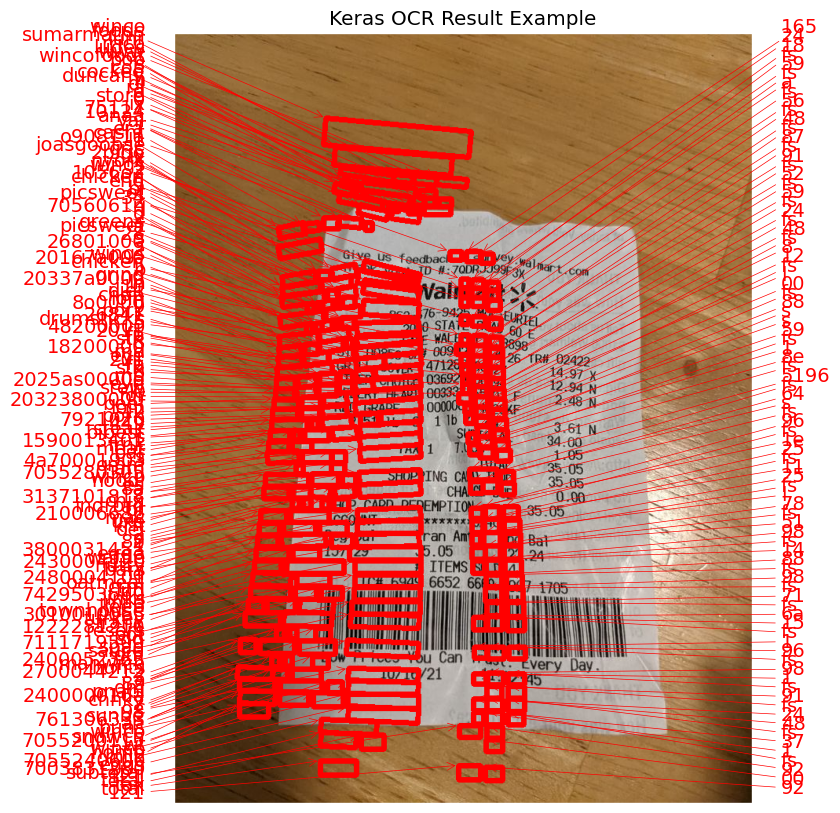

In [30]:
fig, ax = plt.subplots(figsize=(10, 10))
keras_ocr.tools.drawAnnotations(plt.imread(img_fns[11]), results[0], ax=ax)
ax.set_title('Keras OCR Result Example')
plt.show()

# Plot Results: easyocr vs keras_ocr

In [31]:
def plot_compare(img_fn, easyocr_df, kerasocr_df):
    img_id = img_fn.split('/')[-1].split('.')[0]
    fig, axs = plt.subplots(1, 2, figsize=(15, 10))

    easy_results = easyocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
    easy_results = [(x[0], np.array(x[1])) for x in easy_results]
    keras_ocr.tools.drawAnnotations(plt.imread(img_fn), 
                                    easy_results, ax=axs[0])
    axs[0].set_title('easyocr results', fontsize=24)

    keras_results = kerasocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
    keras_results = [(x[0], np.array(x[1])) for x in keras_results]
    keras_ocr.tools.drawAnnotations(plt.imread(img_fn), 
                                    keras_results, ax=axs[1])
    axs[1].set_title('keras_ocr results', fontsize=24)
    plt.show()
# def plot_recipts(img_fn, kerasocr_df):
#     img_id = img_fn.split('/')[-1].split('.')[0]
#     fig, axs = plt.subplots(1, 2, figsize=(15, 10))

#     keras_results = kerasocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
#     keras_results = [(x[0], np.array(x[1])) for x in keras_results]
#     keras_ocr.tools.drawAnnotations(plt.imread(img_fn), 
#                                     keras_results, ax=axs[1])
#     axs[1].set_title('keras_ocr results', fontsize=24)
#     plt.show()
# def plot_recipts(img_fn, kerasocr_df):
#     img_id = img_fn.split('/')[-1].split('.')[0]
#     fig, axs = plt.subplots(1, 2, figsize=(15, 10))

#     keras_results = kerasocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
#     keras_results = [(x[0], np.array(x[1])) for x in keras_results]
#     keras_ocr.tools.drawAnnotations(plt.imread(img_fn), 
#                                     keras_results, ax=axs[1])
#     axs[1].set_title('keras_ocr results', fontsize=24)
#     plt.show()

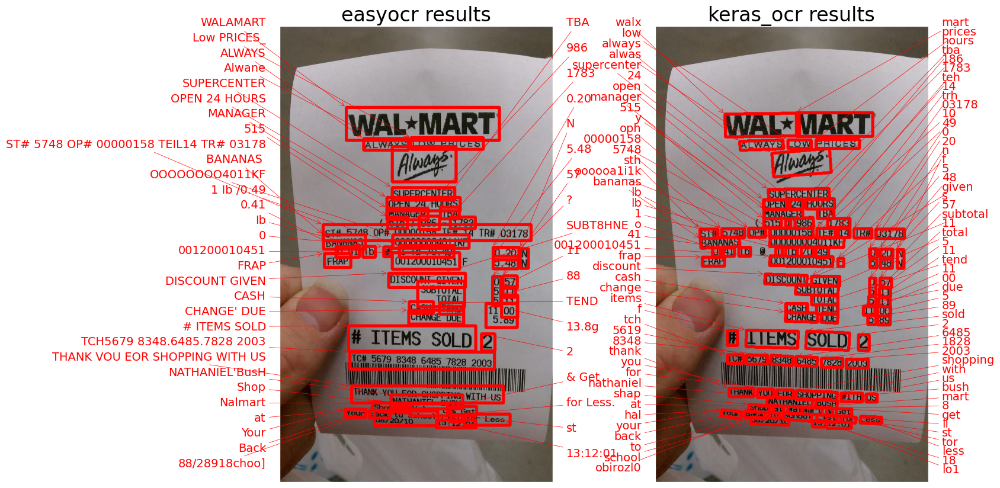

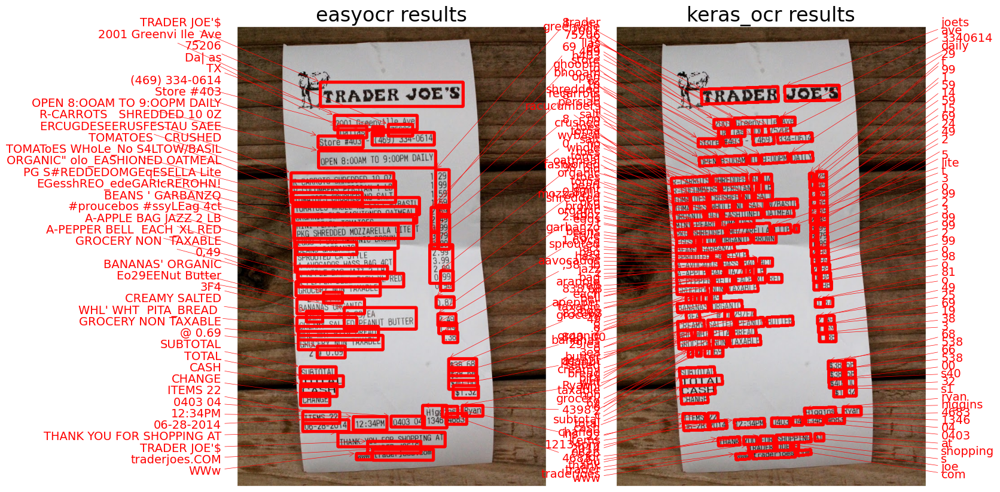

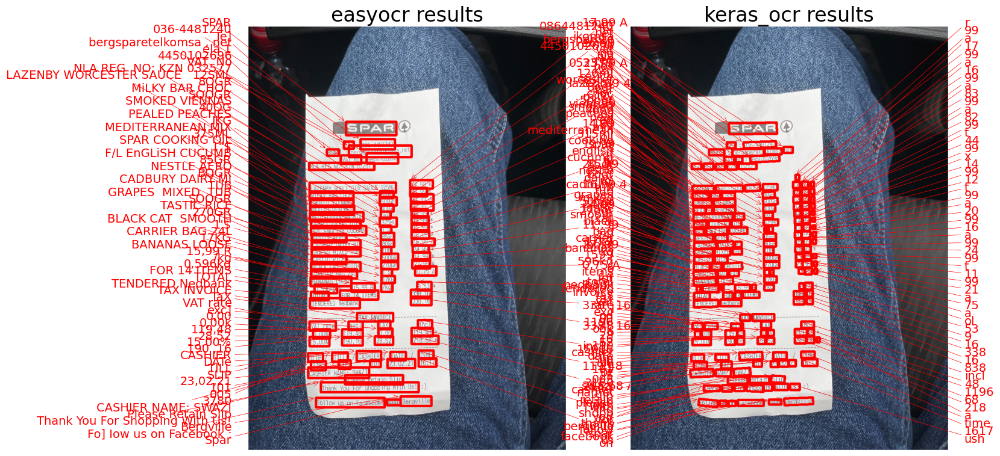

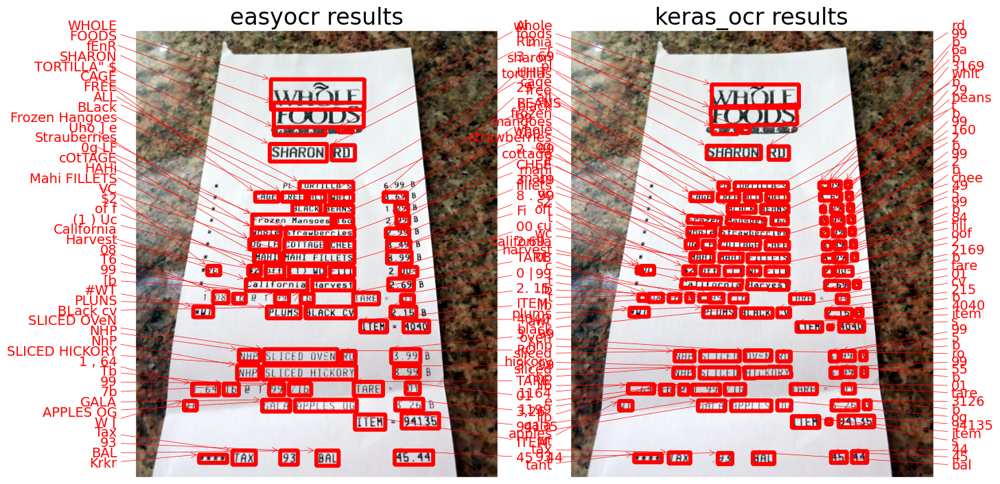

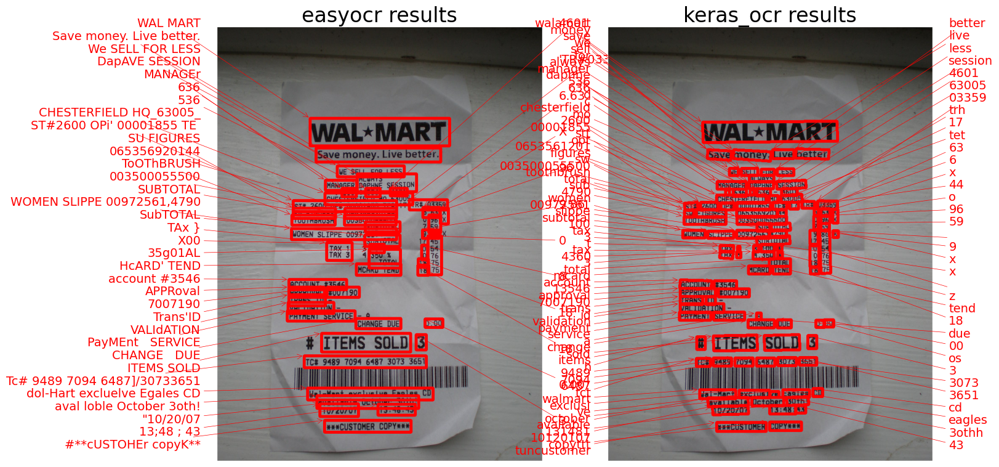

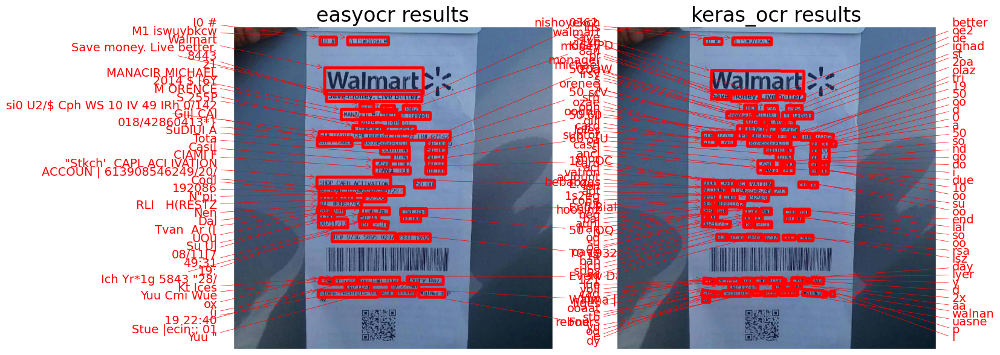

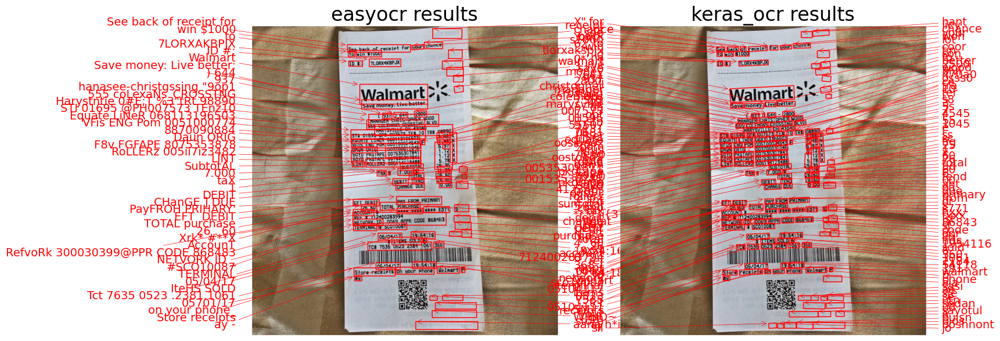

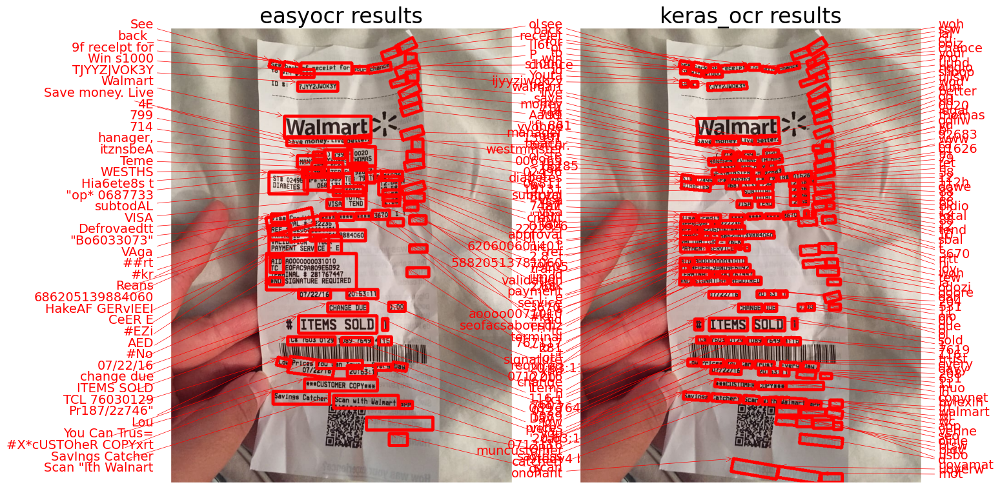

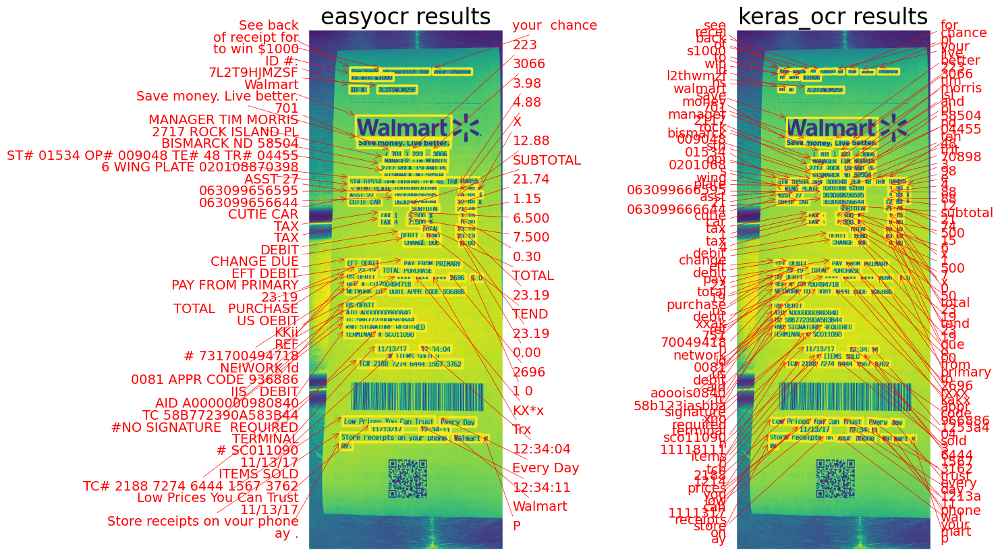

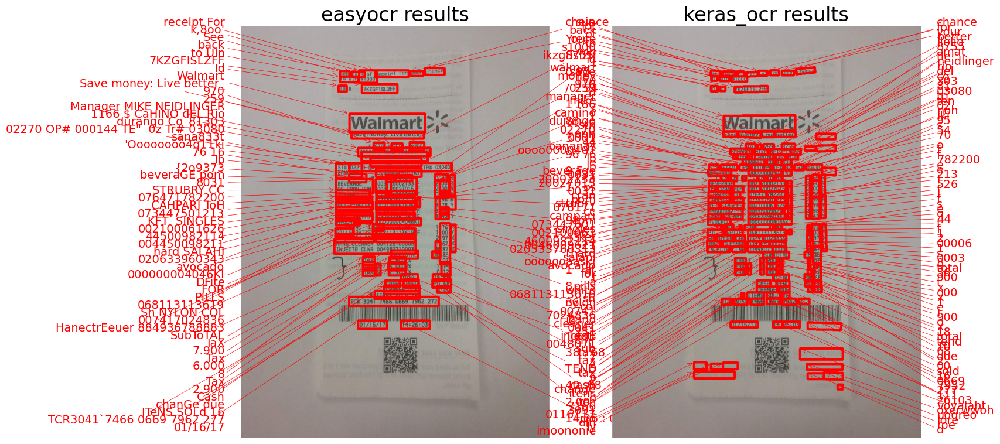

In [32]:
# Loop over results
# easyocr_df = kerasocr_df
for img_fn in img_fns[:10]:
    plot_compare(img_fn, easyocr_df, kerasocr_df) 
# for img_fn in img_fns[:10]:
#     plot_recipts(img_fn, kerasocr_df) 

In [35]:
# df = pd.DataFrame(data=predicted_labels)
kerasocr_df
kerasocr_df.to_csv('kerasocr_df_text.csv', sep='\t', encoding='utf-8', index=False, header=True)

In [36]:
easyocr_df
easyocr_df.to_csv('easyocr_df_text.csv', sep='\t', encoding='utf-8', index=False, header=True)

# The End